<img src="question.png">

## Audio processing in Python

Sound is represented in the form of an audio signal having parameters such as frequency, bandwidth, decibel etc. <br>
A typical audio signal can be expressed as a function of Amplitude and Time.
<img src="sound.png">

Any given signal can be represnted in both time domain and frequency domain. <br>
The audio signal is a three-dimensional signal in which three axes represent time, amplitude and frequency.
<img src="sound_rep.jpeg">

### Librosa
It is a Python module to analyze audio signals in general but geared more towards music.<br>
Documentation for installation and reference: https://librosa.org/doc/latest/index.html <br>
##### Installation
pip install librosa <br>
or <br>
conda install -c conda-forge librosa

### IPython.display.Audio
IPython.display.Audio lets you play audio directly in a jupyter notebook.

In [2]:
import librosa
audio_path = 'avicii.mp3'
x , sr = librosa.load(audio_path)

/Users/prateekmanocha/opt/anaconda3/envs/cv/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [3]:
print(type(x), type(sr))
print(x.shape, sr)
print(x.size/sr)

<class 'numpy.ndarray'> <class 'int'>
(4374368,) 22050
198.38403628117914


### What is sampling rate? And how to change it?
The sample rate is the number of samples of audio carried per second, measured in Hz or kHz.

In [5]:
y, sry = librosa.load(audio_path, sr=44100)
print(y.shape, sry)
print(y.size/sry)

/Users/prateekmanocha/opt/anaconda3/envs/cv/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


(8748735,) 44100
198.38401360544216


In [4]:
import IPython.display as ipd
ipd.Audio(audio_path)

### Visualising Audio
Plot the audio array using librosa.display.waveplot

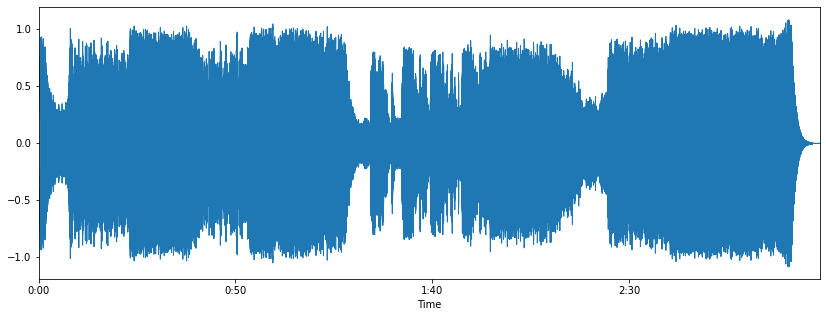

In [5]:
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.show()

**librosa.display** is used to display the audio files in different formats such as wave plot, spectrogram, or colormap.<br> **Waveplots** let us know the loudness of the audio at a given time. <br> **Spectogram** shows different frequencies playing at a particular time along with it’s amplitude.

### Spectrogram
<br>
A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. It’s a representation of frequencies changing with respect to time for given music signals.

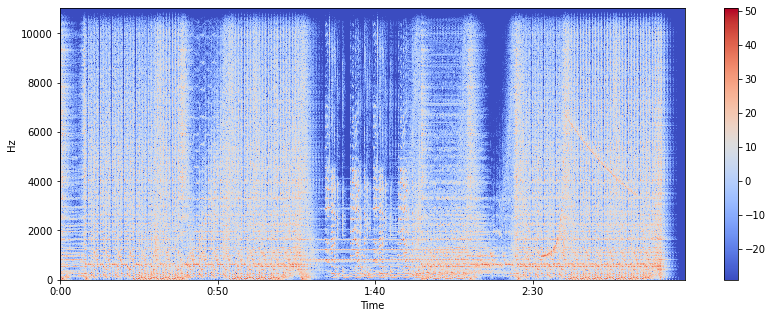

In [8]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

The vertical axis shows frequencies (from 0 to 10kHz), and the horizontal axis shows the time of the clip. 

STFT: Amplitude of given frequency at a given time.

/Users/prateekmanocha/opt/anaconda3/envs/cv/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/Users/prateekmanocha/opt/anaconda3/envs/cv/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/Users/prateekmanocha/opt/anaconda3/envs/cv/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


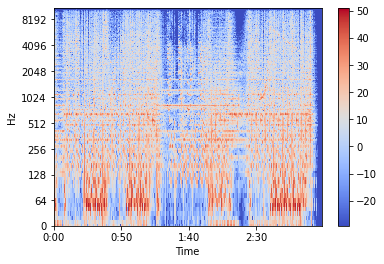

In [9]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

### Create your own sound

In [10]:
import numpy as np
sr = 22050 # sample rate
T = 5.0    # seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
x_own = 0.5*np.sin(2*np.pi*220*t)# pure sine wave at 220 Hz

In [11]:
ipd.Audio(x_own, rate=sr) # load a NumPy arrayb

110250.0


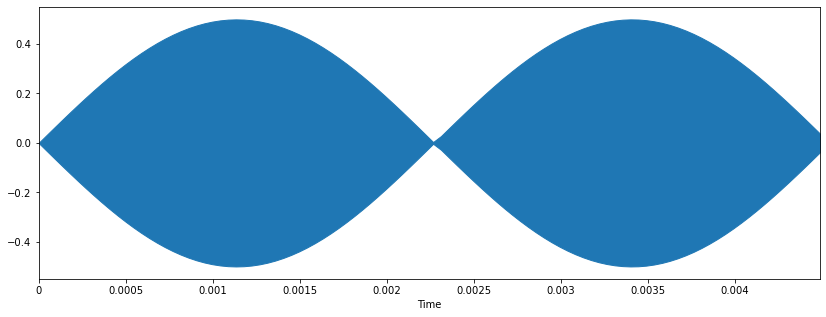

In [12]:
print(T*sr)
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x_own[:100], sr=sr)

## Feature Extraction

Every audio signal consists of many features. <br>
Extract the characteristics that are relevant to the problem we are trying to solve! <br>
The process of extracting features to use them for analysis is called **feature extraction**.

### Zero Crossing Rate
The zero crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to negative or back. <br>
Used in both speech recognition and music information retrieval. <br>
It usually has higher values for highly percussive sounds like those in metal and rock.

In [13]:
# Visualise the audio
# How to visualise a particular section of this audio?

4374368


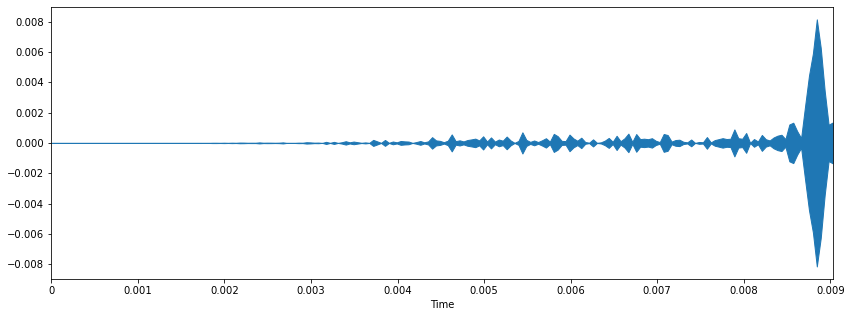

In [14]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x[6800:7000], sr=sr)
print(len(x))

In [8]:
#zero_crossings = librosa.zero_crossings(x, pad=False)
zero_crossings = librosa.zero_crossings(x[6500:7000], pad=False)
#print(zero_crossings)
print(len(zero_crossings))
print(sum(zero_crossings))

500
136


### Spectral Centroid

It indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. If the frequencies in music are same throughout then spectral centroid would be around a centre and if there are high frequencies at the end of sound then the centroid would be towards its end.

In [16]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
print(len(frames))

8544


.spectral_centroid is used to calculate the spectral centroid for each frame. So it’ll return an array with columns equal to a number of frames present.<br>
.frames_to_time converts frame to time. time[i] == frame[i].

In [17]:
import sklearn
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

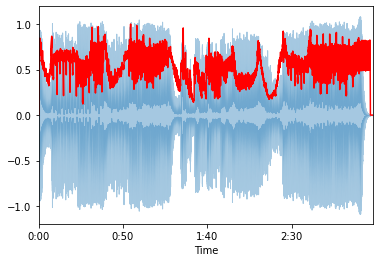

In [18]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

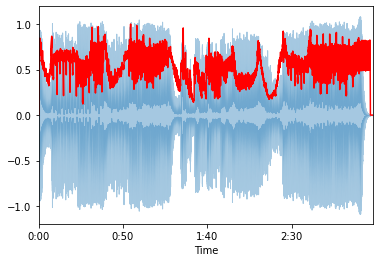

In [19]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

### Spectral Rolloff
It is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies. <br>
librosa.feature.spectral_rolloff computes the rolloff frequency for each frame in a signal

8544


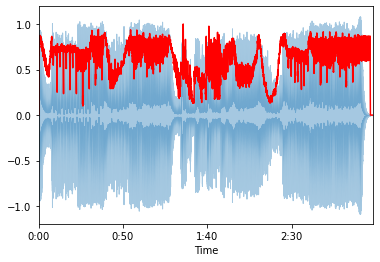

In [20]:
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.000001, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
print(len(spectral_rolloff))
plt.plot(t, normalize(spectral_rolloff), color='r')

### Mel Scale

A mel is a number that corresponds to a pitch, similar to how a frequency describes a pitch. <br>
Humans do not perceive frequencies on a linear scale. We are better at detecting differences in lower frequencies than higher frequencies.<br>

500-1000Hz: Yes <br>
10,000-10,500Hz: No



**Mel Scale:** A unit of pitch such that equal distances in pitch sounded equally distant to the listener.

In [21]:
n_mels = 128
mel = librosa.filters.mel(sr=sr, n_fft=2048, n_mels=n_mels)

Text(0.5, 1.0, '2. Easier to see what is happening with only 10 mels.')

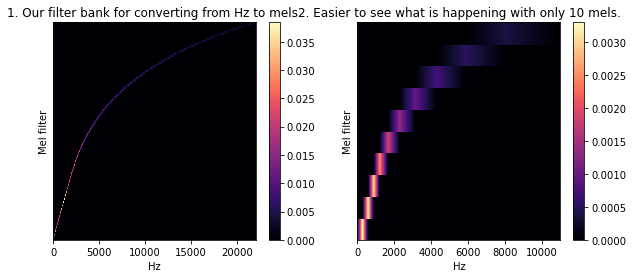

In [25]:
plt.figure(figsize=(10, 4))
hop_length = 512
n_fft=2048

plt.subplot(1, 2, 1)
librosa.display.specshow(mel, sr=22050*2, hop_length=hop_length, x_axis='linear')
plt.ylabel('Mel filter')
plt.colorbar()
plt.title('1. Our filter bank for converting from Hz to mels.')

plt.subplot(1, 2, 2)
mel_10 = librosa.filters.mel(sr=sr, n_fft=n_fft, n_mels=10)
librosa.display.specshow(mel_10, sr=sr, hop_length=hop_length, x_axis='linear')
plt.ylabel('Mel filter')
plt.colorbar()
plt.title('2. Easier to see what is happening with only 10 mels.')


#plt.tight_layout()

### Mel Spectrogram

A Spectrogram with the Mel Scale as its y axis.

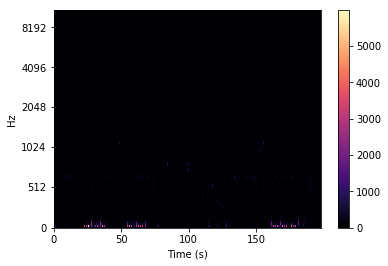

In [20]:
spec = librosa.feature.melspectrogram(y=x, sr=sr)
import librosa.display
librosa.display.specshow(spec,y_axis='mel', x_axis='s', sr=sr)
plt.colorbar()

### Log Mel Spectrogramm

In [16]:
db_spec = librosa.power_to_db

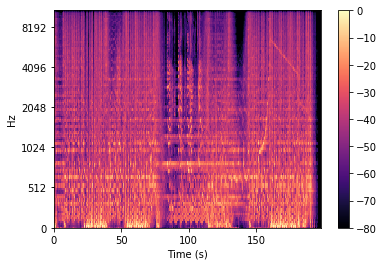

In [21]:
import numpy as np
db_spec = librosa.power_to_db(spec, ref=np.max,)
librosa.display.specshow(db_spec,y_axis='mel', x_axis='s', sr=sr)
plt.colorbar()

### Mel-Frequency Cepstral Coefficients (MFCC)

The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. <br>
<br>
The mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency.

(20, 8544)


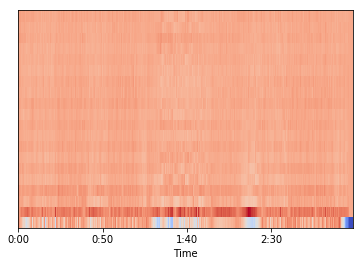

In [24]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

[-1.4287256e-08  3.5718140e-09  6.2506742e-09 -3.5718140e-09
  4.9112443e-09 -9.8224886e-09 -5.3577209e-09 -7.1436279e-09
  8.9295344e-09  7.1436279e-09 -9.3760120e-09  4.9112443e-09
 -3.5718140e-09 -3.5718140e-09 -7.1436279e-09 -3.5718140e-09
 -4.9112443e-09  7.1436279e-09 -3.5718140e-09  1.7859070e-09]
[1.         1.         1.         1.         1.         1.0000001
 0.9999999  1.0000001  0.99999976 0.9999999  0.9999999  1.0000002
 1.         1.0000001  0.9999999  1.         1.0000001  1.0000001
 0.9999999  0.9999999 ]


/home/prateek/anaconda3/envs/dl/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/prateek/anaconda3/envs/dl/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


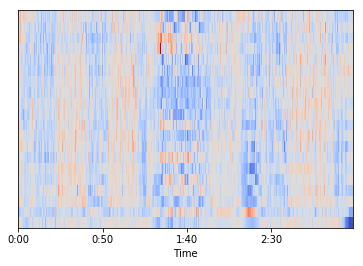

In [25]:
import sklearn
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

### Chroma Frequency

Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.

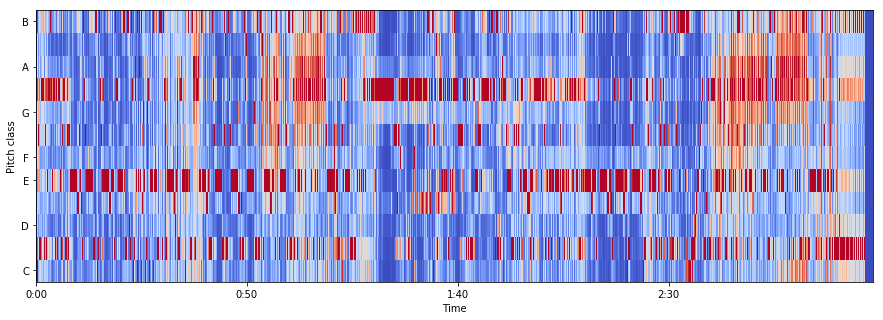

In [53]:
hop_length = 512
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')